In [1]:
import glob
import os
import subprocess
import tarfile
#import wget

In [2]:
%matplotlib inline
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

In [3]:
#%ls

In [4]:
import soundfile as sf

In [14]:
%ls TEDLIUM\TEDLIUM_release2\dev\sph\AlGore_2009.sph

 Volume in drive C is OS
 Volume Serial Number is 181C-B0FB

 Directory of C:\Speech_E2E\TEDLIUM\TEDLIUM_release2\dev\sph

08/18/2014  11:33 AM        14,866,996 AlGore_2009.sph
               1 File(s)     14,866,996 bytes
               0 Dir(s)  243,352,641,536 bytes free


In [19]:
example_file_name = 'TEDLIUM\TEDLIUM_release2\dev\sph\AlGore_2009.sph'
example_file_transcript_name = 'TEDLIUM\TEDLIUM_release2\dev\stm\AlGore_2009.stm'

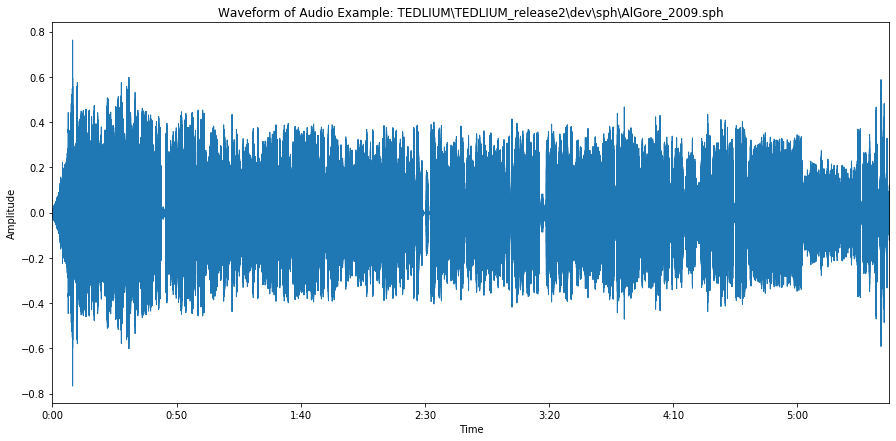

In [17]:
audio, sample_rate = sf.read(example_file_name)
plt.rcParams['figure.figsize'] = (15,7)
plt.title(f'Waveform of Audio Example: {example_file_name}')
plt.ylabel('Amplitude')

_ = librosa.display.waveplot(audio)

In [70]:
segments

['AlGore_2009 1 S28 0.00 13.04 <F0_M> ignore_time_segment_in_scoring',
 'AlGore_2009 1 Al_Gore 13.04 23.46 <F0_M> last year i showed these two slides so that demonstrate that the arctic ice cap which for most of the last three million years has been the size of the lower forty eight states has shrunk by forty percent',
 "AlGore_2009 1 Al_Gore 23.46 40.05 <F0_M> but this understates the seriousness of this particular problem because it doesn 't show the thickness of the ice the arctic ice cap is in a sense the beating heart of the global climate system it expands in winter and contracts in summer the next slide i show you will be",
 "AlGore_2009 1 Al_Gore 40.05 52.68 <F0_M> a rapid fast forward of what 's happened over the last twenty five years the permanent ice is marked in red and as you see it expands to the dark blue that 's the annual ice in winter and it contracts in summer",
 'AlGore_2009 1 Al_Gore 52.68 60.29 <F0_M> and the so called permanent ice five years old or older you ca

In [71]:
segments[1]

'AlGore_2009 1 Al_Gore 13.04 23.46 <F0_M> last year i showed these two slides so that demonstrate that the arctic ice cap which for most of the last three million years has been the size of the lower forty eight states has shrunk by forty percent'

In [72]:
segments[-1]

'AlGore_2009 1 S41 457.97 464.59 <F0_F> ignore_time_segment_in_scoring'

In [73]:
len(segments)

62

In [74]:
import re

In [59]:
def segment_by_idx(idx):
    the_md, the_transcript = re.split(r' <.+> ',segments[idx])
    left_timestamp, right_timestamp = map(float,the_md.split(' ')[-2:])
    left_idx = int(left_timestamp*sample_rate)
    right_idx = int(right_timestamp*sample_rate)
    print(the_transcript)
    return ipd.Audio(audio[left_idx: right_idx], rate=sample_rate)

In [79]:
segment_by_idx(31)

coalergy we view climate change as a very serious threat to our business that 's why we 've made it our primary goal to spend a large sum of money on an advertising effort to help bring out and complicate the truth about coal


In [81]:
from ipywidgets import interact
import ipywidgets as widgets

In [83]:
interact(segment_by_idx, idx=widgets.IntSlider(min=0, max=len(segments)-1, step=1, value=10));

interactive(children=(IntSlider(value=10, description='idx', max=61), Output()), _dom_classes=('widget-interac…

In [80]:
# example_file = data_dir + '/an4/wav/an4_clstk/mgah/cen2-mgah-b.wav'
# audio, sample_rate = librosa.load(example_file)

# plt.rcParams['figure.figsize'] = (15,7)
# plt.title('Waveform of Audio Example')
# plt.ylabel('Amplitude')